In [5]:
import json
from typing import List

import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import targetpad_transform
from src.cirr_experiment.utils import element_wise_sum_original, get_combing_function_with_alpha, \
    convert_to_pivot_cirr, prepare_and_plot_recall_pivot, prepare_ground_truths, plot_retrieval_results_of_i, \
    found_better_than_original
from src.cirr_experiment.validate_notebook import cirr_val_retrieval_text_image_grid_search, compute_results_cirr_val
from src.utils import device

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Set up the experiment</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Set up the cache for the experiment</div>

In [6]:
cache = {}

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [7]:
BLIP_PRETRAINED_PATH = '../../../models/model_large_retrieval_flickr.pth'
MED_CONFIG_PATH = '../../blip_modules/med_config_large.json'

In [8]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True,
    vit='large',
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../../../models/model_large_retrieval_flickr.pth for text_encoder.
load checkpoint from ../../../models/model_large_retrieval_flickr.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [9]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH, vit='large')
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder.eval()

load checkpoint from ../../../models/model_large_retrieval_flickr.pth for visual_encoder.
load checkpoint from ../../../models/model_large_retrieval_flickr.pth for vision_proj.


blip img encoder loaded.

BLIPImgEncoder(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1024, out_features=3072, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=1024, out_features=1024, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=1024, out_features=4096, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=4096, out_features=1024, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
      

In [10]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [11]:
combining_function_original = element_wise_sum_original

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the MLLM generated text captions</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions</div>

In [12]:
with open('../../../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
print(f'Total number of text captions: {len(text_captions)}')

Total number of text captions: 4609

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [13]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    result = cirr_val_retrieval_text_image_grid_search(
        get_combing_function_with_alpha(alpha),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot_cirr(total_result)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [14]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,7.055728,7.079646,7.079646,7.103564,7.127482,7.151400,7.199235,7.247070,7.342741,7.366659,...,7.486247,7.677589,7.797178,8.132026,8.419038,8.849557,10.069361,12.676392,22.721837,31.093040
0.05,7.055728,7.079646,7.151400,7.199235,7.294905,7.318823,7.390577,7.438412,7.486247,7.438412,...,7.605836,7.845013,8.012437,8.299450,8.706051,9.423583,10.619469,13.800526,24.372160,32.001913
0.10,7.151400,7.199235,7.223152,7.247070,7.270988,7.390577,7.438412,7.462329,7.558001,7.677589,...,7.964602,8.299450,8.395121,8.777805,9.160488,10.045443,11.432672,15.163836,25.902894,31.930161
0.15,7.199235,7.270988,7.318823,7.390577,7.510165,7.438412,7.486247,7.677589,7.868931,7.940684,...,8.323368,8.466874,9.016982,9.423583,10.093279,10.906482,12.604640,16.909830,27.648887,31.786653
0.20,7.175317,7.294905,7.390577,7.558001,7.677589,7.821096,7.868931,7.868931,7.988519,8.251614,...,9.016982,9.327912,9.734514,10.045443,10.715140,12.030615,14.350633,18.560153,29.036117,31.356135
0.25,7.223152,7.366659,7.462329,7.581918,7.773260,7.916766,8.060273,8.084191,8.299450,8.538627,...,9.423583,9.854102,10.404210,11.049988,11.767520,13.609184,15.833533,20.066969,29.729730,30.447263
0.30,7.055728,7.127482,7.342741,7.510165,7.701506,7.821096,8.036355,8.299450,8.442956,8.873475,...,9.878019,10.547716,11.217412,12.198038,13.585266,15.331261,17.149007,21.884717,29.992825,29.921073
0.35,7.055728,7.199235,7.342741,7.462329,7.677589,7.964602,8.155943,8.347286,8.729969,8.873475,...,10.236786,11.241329,11.934943,13.202584,14.876823,16.383640,18.895002,23.487204,29.897153,29.490551
0.40,7.031810,7.175317,7.294905,7.581918,7.773260,7.964602,8.155943,8.395121,8.753887,9.232241,...,10.786893,11.600096,12.724228,14.350633,15.929204,17.770869,20.712748,24.659173,30.064577,28.677350


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,25.520211,25.591964,25.711551,25.831142,25.950730,25.998566,26.070318,26.213825,26.405168,26.524755,...,27.218369,27.624971,27.983737,28.629515,29.634058,30.973452,33.867496,40.253529,55.226022,57.354701
0.05,25.855058,25.998566,26.142073,26.333413,26.500836,26.596507,26.740015,26.859602,27.146617,27.481464,...,28.198996,28.629515,29.227456,29.825401,30.925617,32.815117,36.020091,42.669219,57.067686,58.502752
0.10,26.237741,26.524755,26.692179,26.955274,27.170533,27.314040,27.505383,27.744558,27.959818,28.486007,...,29.418799,30.088496,30.782109,31.547478,32.623774,34.991628,38.292274,44.941401,58.550584,58.622336
0.15,26.165989,26.524755,26.763931,27.170533,27.529299,27.744558,28.175077,28.533843,29.083952,29.657978,...,30.734274,31.380051,32.145420,33.389142,34.680697,37.168142,40.779719,47.309256,59.889978,58.933270
0.20,26.405168,26.716095,26.907438,27.074862,27.696723,28.509927,28.916526,29.442716,30.088496,30.758193,...,31.714901,32.695529,33.700073,35.135135,37.120306,39.631668,43.625927,49.390098,60.296577,58.909351
0.25,26.237741,26.453000,26.811767,27.314040,27.624971,28.366420,28.940445,29.657978,30.542931,31.475723,...,32.934704,34.250179,35.565653,37.239894,39.248982,41.975603,45.467591,51.710117,61.301124,58.287489
0.30,26.118153,26.524755,27.003109,27.505383,27.911982,28.605598,29.514471,30.112413,31.308299,32.288927,...,34.608945,36.091843,37.526909,39.105478,41.497248,44.008610,47.428843,53.432190,61.420715,57.354701
0.35,25.783306,26.237741,26.620427,27.290121,27.911982,28.916526,29.729730,30.710357,31.954077,33.413059,...,35.972255,37.479073,39.272901,40.923223,43.482420,45.730686,49.079168,54.484576,61.372876,56.565416
0.40,25.496292,25.998566,26.405168,27.170533,27.840230,28.892609,29.921073,30.949533,32.312843,33.963168,...,37.144223,38.985887,40.803635,43.051901,45.060989,47.955036,50.944752,55.297774,60.464007,54.986846


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,36.928964,37.024635,37.096387,37.120306,37.239894,37.550825,37.718248,37.909591,38.196602,38.507533,...,39.248982,39.846927,40.516624,41.521168,43.004066,45.467591,48.959580,55.584788,68.978715,68.476439
0.05,37.455153,37.646496,37.766084,38.029179,38.364029,38.531452,38.627124,38.985887,39.272901,39.583832,...,40.588376,41.688591,42.669219,43.769434,45.371920,47.428843,51.303518,58.143985,70.605117,68.859124
0.10,37.718248,37.981343,38.340110,38.579288,38.961971,39.416409,39.751256,40.181774,40.468788,41.090649,...,42.645299,43.362832,44.630471,45.802438,47.237504,49.772781,53.432190,60.655344,72.303277,69.074386
0.15,37.933508,38.387945,38.722792,38.985887,39.559913,39.894763,40.349197,41.138485,41.856015,42.764890,...,44.008610,45.228416,46.424299,47.739774,50.035876,52.092803,55.847883,62.807941,72.949058,69.074386
0.20,37.933508,38.435781,38.698876,39.248982,39.727339,40.373117,41.114566,42.071274,43.027985,44.032529,...,46.065533,47.261420,48.552978,50.227219,51.614445,54.317147,58.454913,64.697438,73.594832,68.715620
0.25,37.622577,38.220522,38.746712,39.296818,40.229610,41.018894,41.975603,43.004066,44.056445,45.013154,...,47.715858,49.007416,50.442475,52.164555,54.197562,56.924182,60.535759,65.965080,73.618752,68.524277
0.30,37.479073,38.172686,38.746712,39.535996,40.397033,41.497248,42.836642,43.602008,44.989237,46.017700,...,49.127004,50.729489,52.116716,54.173642,56.350154,58.670175,62.353504,67.495817,73.355657,67.806745
0.35,37.144223,38.148767,38.698876,39.440325,40.301365,41.497248,42.908394,44.343460,45.730686,47.165748,...,50.538146,52.260226,54.101890,56.254482,57.928723,60.798854,64.195168,68.380773,72.733796,67.065293
0.40,36.905047,37.694332,38.579288,39.296818,40.349197,41.497248,42.956230,44.750059,46.304712,48.098540,...,51.757956,53.790957,55.823964,57.450372,59.866059,62.281752,65.223628,68.906963,72.375029,66.036832


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,64.338672,64.506102,64.697438,64.960533,65.175796,65.391058,65.630233,65.941161,66.276008,66.706532,...,67.687154,68.452525,69.337481,70.652956,72.207606,74.575460,78.115284,83.329350,89.691460,85.840708
0.05,65.223628,65.534562,65.749818,66.036832,66.467351,66.993541,67.280555,67.854577,68.332934,68.691701,...,69.911504,70.868212,71.968430,73.236066,75.029898,77.278161,80.674481,84.979671,90.408993,86.199474
0.10,65.654153,66.252095,66.778284,67.471898,68.117678,68.548197,68.930876,69.480985,70.150679,70.987803,...,72.327197,73.379576,74.288446,75.819182,77.589095,79.837358,82.683569,86.390817,91.078687,86.438650
0.15,66.443437,67.160964,67.758912,68.452525,69.050467,69.624490,70.246351,71.011722,71.729249,72.685963,...,74.766803,75.580007,76.704139,78.210956,79.980868,81.918204,84.262139,87.945467,91.557044,86.629993
0.20,66.754365,67.543650,68.237263,69.026548,69.648409,70.413774,71.418321,72.614205,73.618752,74.718964,...,76.751971,77.636927,79.071993,80.746233,81.989956,83.401102,85.936379,88.710833,91.628796,86.869168
0.25,66.323847,67.447978,68.332934,69.552737,70.772541,71.322650,72.422868,74.073189,75.197321,76.417124,...,78.737146,79.813445,81.200671,82.037789,83.257592,85.362351,86.940920,89.500117,91.891891,86.893088
0.30,66.443437,67.687154,68.596029,70.007175,71.107394,71.944511,73.403490,74.958146,76.393205,77.828270,...,80.004781,81.344175,82.157379,83.329350,85.027504,86.366898,88.065058,89.834970,91.772306,86.510402
0.35,66.156423,67.160964,68.356854,69.768000,71.226978,72.614205,74.240613,75.699592,77.493423,78.737146,...,81.368095,82.276970,83.377182,85.123175,85.984212,87.371445,88.710833,90.145898,91.461372,86.103803
0.40,65.391058,66.993541,68.093759,69.528818,71.322650,73.092562,74.982059,76.608467,78.139204,79.765606,...,82.133460,83.185840,84.692657,85.912460,87.036592,88.017219,89.021766,89.906722,91.030854,85.625446


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,20.473571,20.617077,20.640995,20.736666,20.808420,20.999761,21.095432,21.382445,21.597704,21.836881,...,22.482659,23.008850,23.487204,24.180818,25.089690,26.644343,29.251376,34.608945,48.576894,71.011722
0.05,20.593159,20.736666,20.975843,21.119349,21.358527,21.549869,21.812963,22.099976,22.434825,22.650084,...,23.295863,23.774217,24.324325,25.376704,26.763931,28.294668,31.069121,36.952883,50.633818,71.394402
0.10,21.023679,21.119349,21.430279,21.549869,21.789046,22.123894,22.506577,22.721837,23.056684,23.463286,...,24.515666,25.185362,25.687635,26.811767,28.151160,29.921073,33.221719,39.751256,52.260226,71.729249
0.15,20.928007,21.215020,21.717292,21.956469,22.363071,22.793590,22.984932,23.558958,24.061230,24.515666,...,25.687635,26.333413,27.337956,28.653431,30.136332,32.121503,35.422149,42.406124,53.886628,71.633583
0.20,21.119349,21.454197,21.884717,22.267400,22.697920,23.367615,23.941641,24.204735,25.017938,25.615880,...,27.170533,28.222913,29.370964,30.471179,32.193255,34.226263,38.053098,44.319540,55.895716,71.705335
0.25,21.191102,21.741210,22.076058,22.482659,23.032767,23.582874,24.252571,24.946184,26.022482,26.644343,...,28.486007,29.873237,31.212628,32.456350,34.154508,36.928964,40.851471,46.089453,57.522124,71.394402
0.30,21.191102,21.597704,22.099976,22.745755,23.248027,23.845969,24.707007,25.472376,26.285577,27.385792,...,30.088496,31.427887,32.886869,34.537193,36.952883,39.583832,42.693135,48.624730,58.670175,71.011722
0.35,20.999761,21.645540,22.243482,22.817507,23.654628,24.515666,25.328869,26.213825,27.170533,28.486007,...,31.643146,33.293471,34.991628,36.881128,39.296818,41.497248,45.060989,50.059795,59.650803,70.413774
0.40,21.023679,21.549869,22.410907,23.271945,24.180818,25.065774,25.902894,27.098781,28.079405,29.681894,...,33.341306,34.824204,37.048554,38.985887,41.234154,44.080365,47.668022,51.805788,60.416168,69.648409


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,41.210237,41.377661,41.616839,41.760343,41.927770,42.047358,42.238697,42.406124,42.740971,43.195409,...,44.176033,44.654390,45.563263,46.783066,48.242047,50.298971,53.623533,59.698635,72.016263,86.438650
0.05,41.521168,41.808179,42.071274,42.262617,42.453960,42.932314,43.243244,43.697679,44.104281,44.534799,...,45.922029,46.543890,47.428843,48.720402,50.179380,52.308059,55.680460,62.114328,73.594832,86.510402
0.10,41.569003,42.071274,42.406124,42.860559,43.410668,43.960774,44.582635,45.013154,45.371920,46.065533,...,47.404927,48.098540,49.318346,50.609905,52.068883,54.317147,57.833052,63.932073,75.173402,86.773497
0.15,41.688591,42.238697,42.693135,43.291080,43.841186,44.295624,44.869649,45.658934,46.352547,47.452763,...,48.624730,49.820617,51.040423,52.595073,54.341066,56.350154,60.105240,66.276008,76.369292,86.749583
0.20,41.712508,42.310452,42.860559,43.673763,44.343460,45.013154,45.802438,46.472135,47.189668,48.361635,...,50.298971,51.781869,53.240854,54.580241,56.541497,59.005022,62.473094,68.093759,77.110738,86.629993
0.25,41.592920,42.406124,43.195409,44.199952,44.773978,45.778522,46.543890,47.500598,48.648649,49.772781,...,52.116716,54.030138,55.130351,56.900263,58.718008,61.253291,64.577854,69.433153,77.900022,86.366898
0.30,41.879934,42.525712,43.625927,44.702223,45.563263,46.472135,47.524515,48.624730,49.844536,51.207846,...,54.221481,55.417365,57.187277,59.363788,61.348957,63.238460,66.036832,71.513993,79.024154,86.175555
0.35,41.569003,42.549628,43.482420,44.845730,46.041617,47.309256,48.648649,50.107628,51.303518,52.929920,...,56.039226,57.641715,59.435540,61.253291,63.142788,65.104043,68.189430,72.996891,79.430759,85.840708
0.40,41.329825,42.406124,43.984693,45.539343,46.663478,48.026788,49.605358,51.040423,52.642906,54.460657,...,57.617795,59.579051,61.277205,63.142788,64.625686,67.208803,70.270270,74.192774,79.502511,85.577613


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,61.707723,61.851233,62.018657,62.162161,62.305671,62.520927,62.784022,63.118869,63.262379,63.573307,...,64.577854,65.223628,65.917248,66.993541,68.404686,70.437694,73.188233,78.187037,86.223394,93.350875
0.05,61.588138,61.899066,62.042576,62.305671,62.568766,62.951446,63.262379,63.597226,64.075577,64.577854,...,65.678066,66.252095,67.687154,68.811291,70.485532,72.255439,75.197321,79.693854,87.204015,93.470460
0.10,61.612052,61.875147,62.210000,62.760103,63.238460,63.645059,64.051664,64.410430,64.984453,65.606314,...,67.256635,67.998087,69.098300,70.413774,72.207606,74.049270,77.158576,80.961490,88.160729,93.494380
0.15,61.827314,62.329584,62.807941,63.262379,63.788569,64.290839,65.056205,65.725905,66.108584,66.993541,...,68.811291,69.648409,70.987803,72.183686,73.905766,75.914854,78.234869,82.061708,88.663000,93.590051
0.20,61.827314,62.425256,63.023198,63.668978,64.243007,64.936620,65.725905,66.610861,67.663240,68.524277,...,70.509446,71.513993,72.781628,73.786175,75.580007,77.421671,80.028701,83.353263,89.165270,93.470460
0.25,61.779481,62.616599,63.118869,63.812482,64.936620,65.678066,66.706532,67.758912,68.883044,69.815832,...,71.944511,73.188233,74.336284,75.436497,76.751971,79.191583,81.320256,84.405643,89.547956,93.470460
0.30,61.707723,62.807941,63.645059,64.601767,65.630233,66.586941,67.734993,69.050467,70.078927,71.322650,...,73.259985,74.503708,75.508249,76.871562,78.521883,80.674481,82.803160,85.553694,90.026307,93.422627
0.35,61.827314,62.975365,64.027745,64.769197,65.965080,67.567569,68.715620,70.031095,71.322650,72.901219,...,74.742883,76.034439,77.038985,78.497964,80.339634,81.966037,83.927292,86.701745,90.193731,93.422627
0.40,61.899066,62.951446,64.051664,65.151876,66.228175,68.069839,69.720161,70.868212,72.375029,73.881847,...,76.010525,77.254248,78.474051,79.933029,81.583351,82.970583,85.027504,87.514949,90.361160,93.374789


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [15]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

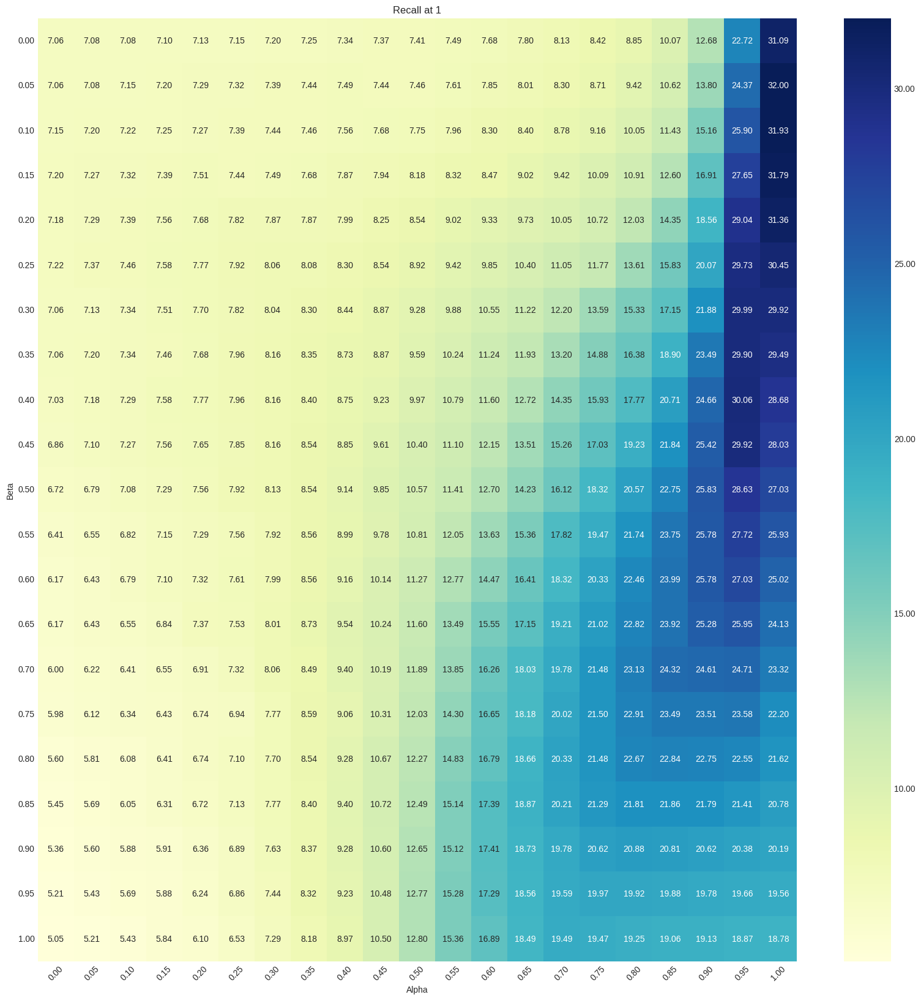

In [16]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

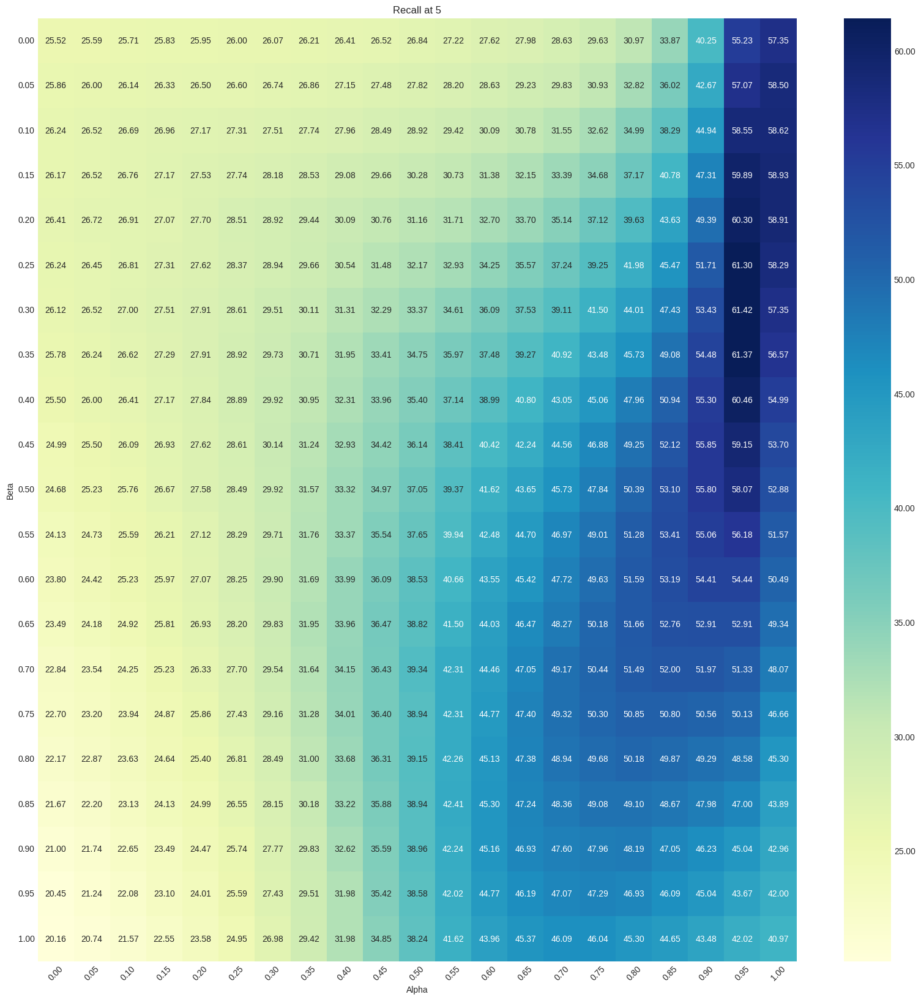

In [17]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

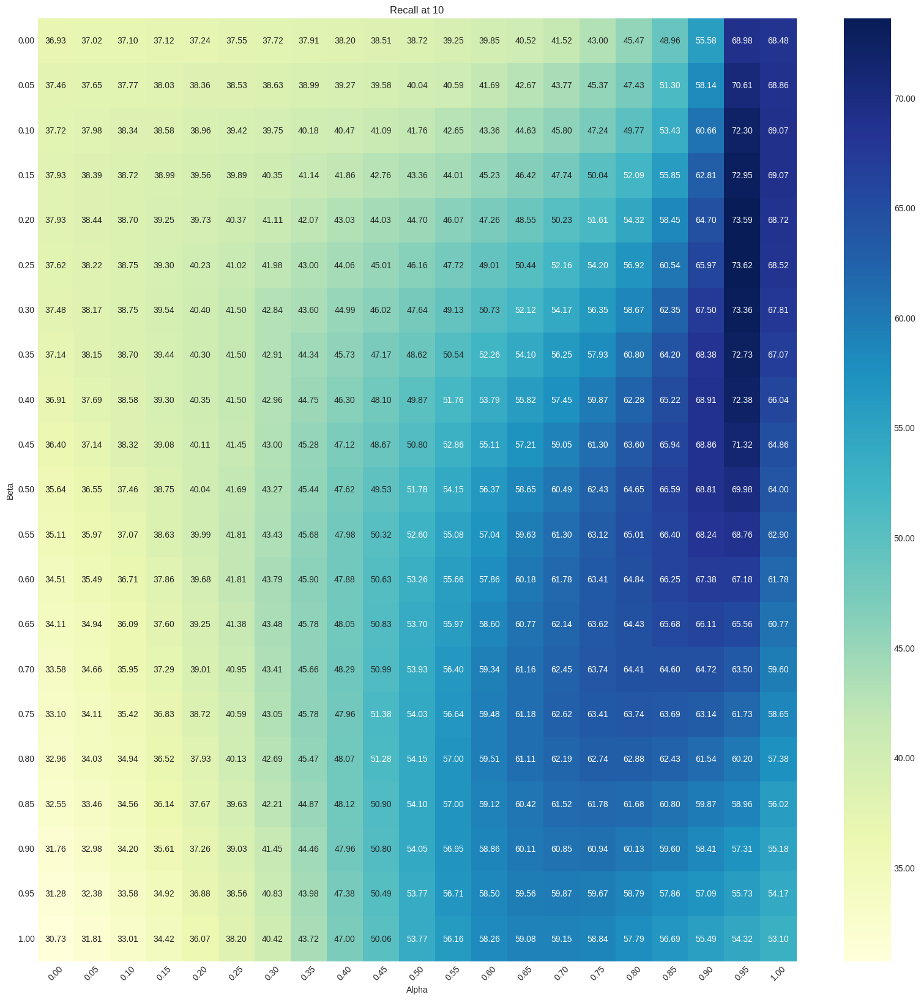

In [18]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

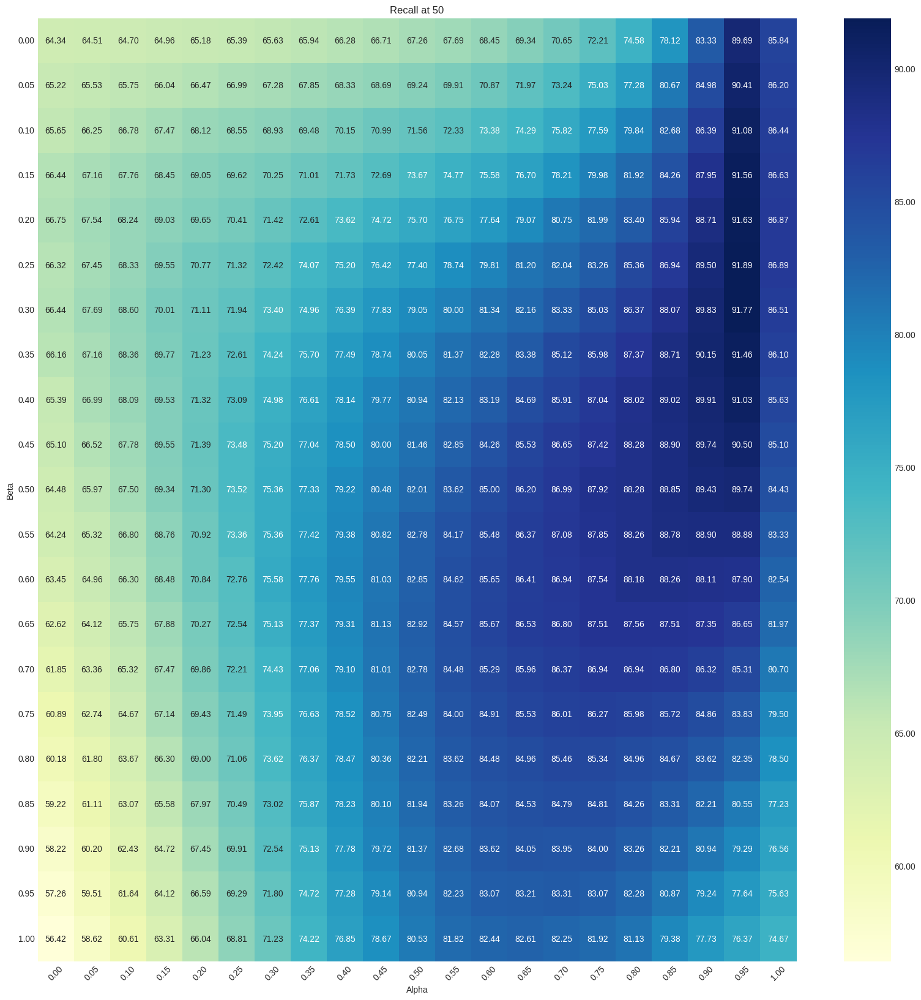

In [19]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

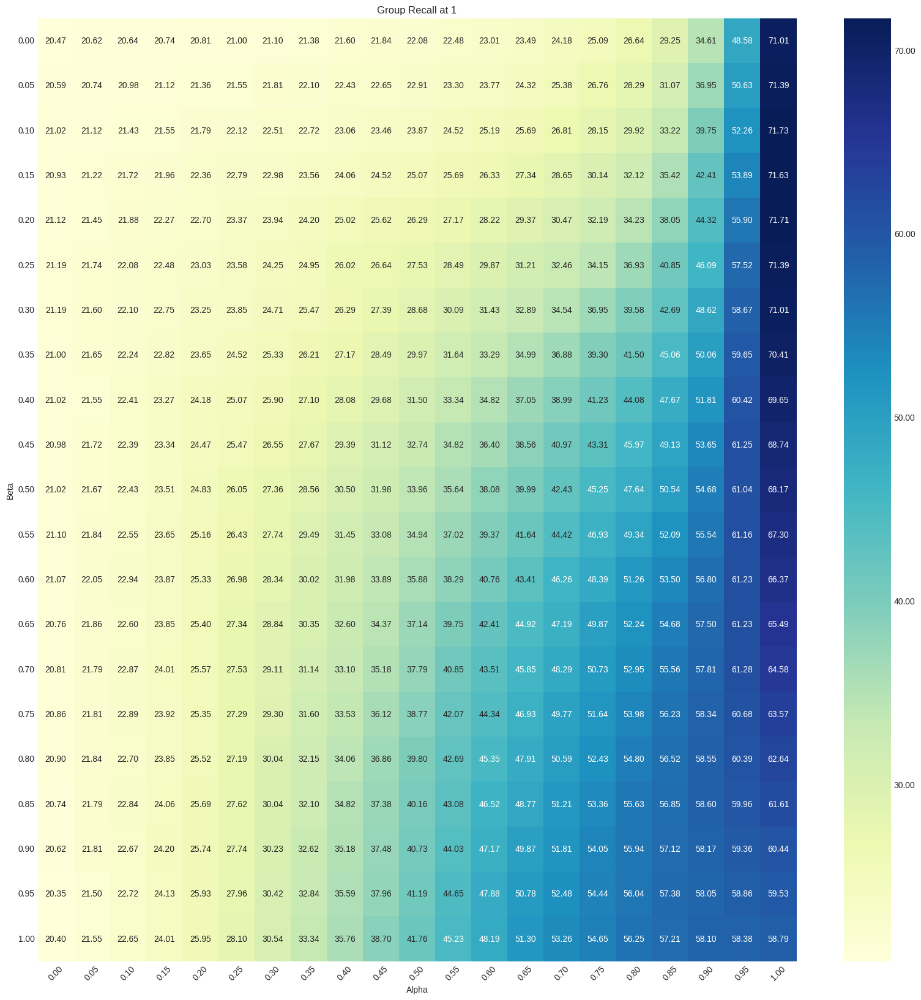

In [20]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

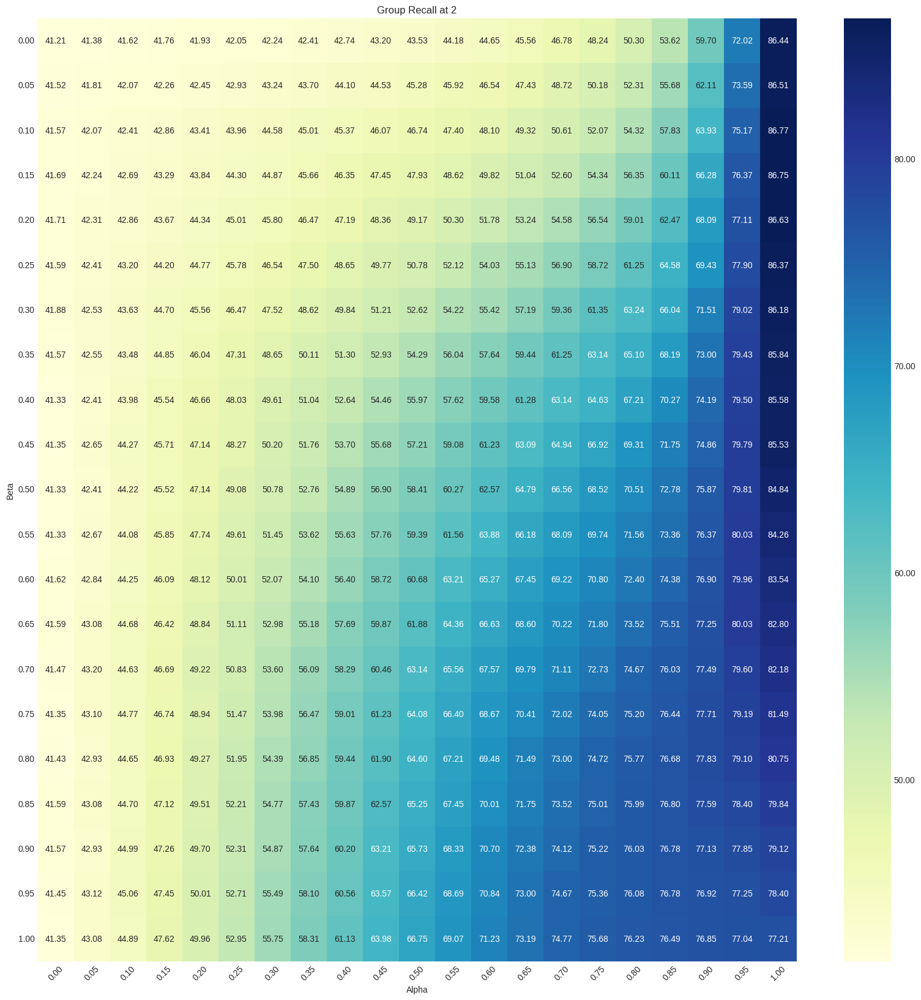

In [21]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

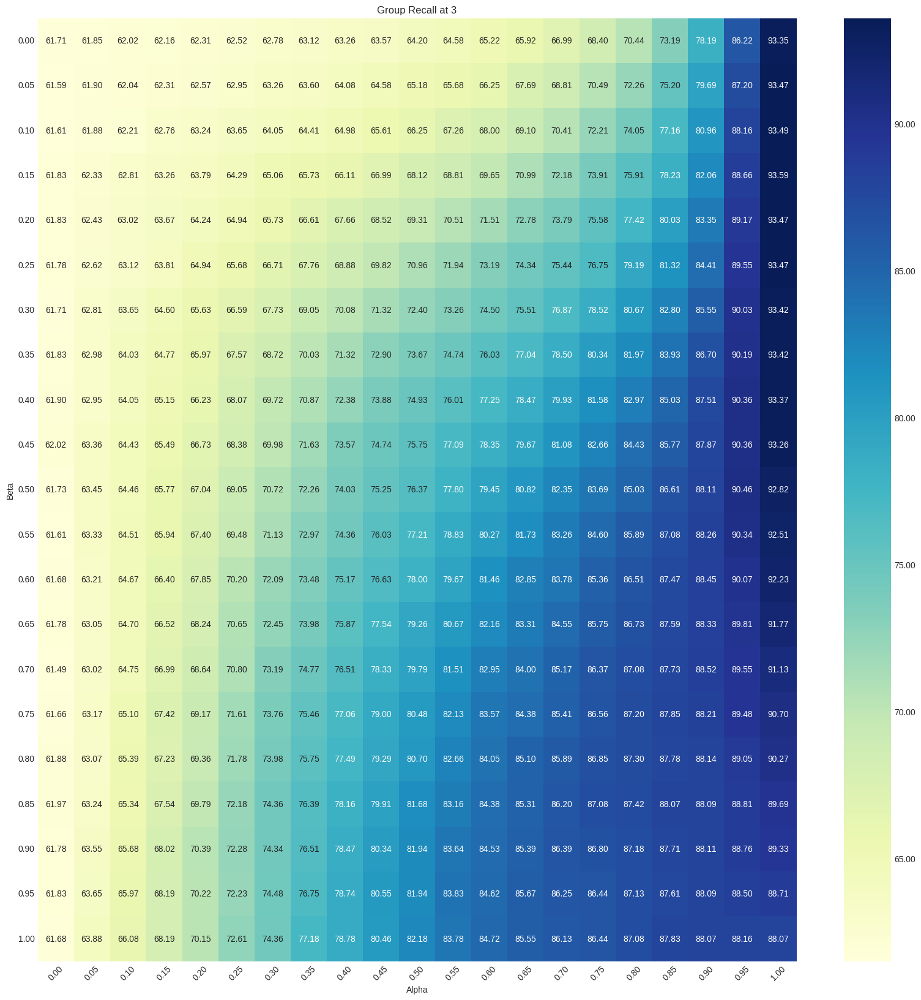

In [22]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [23]:
sorted_indices, image_index_names, target_names = compute_results_cirr_val(
    get_combing_function_with_alpha(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0.2,
    cache=cache,
)

Recall Results
Recall at 1: 29.04
Recall at 5: 60.30
Recall at 10: 73.59
Recall at 50: 91.63
Group Recall Results
Group Recall at 1: 55.90
Group Recall at 2: 77.11
Group Recall at 3: 89.17


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [24]:
ground_truth = prepare_ground_truths(json.load(open('../../../cirr_dataset/cirr/captions/cap.rc2.val.json')))

DATASET_IMAGE_DIR = '../../../cirr_dataset/dev/'

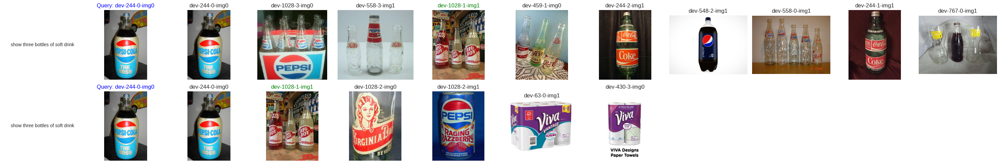

In [25]:
plot_retrieval_results_of_i(
    sorted_indices, 
    image_index_names, 
    target_names, 
    ground_truth, 
    top_k=10, 
    i=0,
    directory=DATASET_IMAGE_DIR,
)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with the original without MMLM captions and identical weights element-wise sum</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [26]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results_cirr_val(
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall Results
Recall at 1: 7.41
Recall at 5: 26.84
Recall at 10: 38.72
Recall at 50: 67.26
Group Recall Results
Group Recall at 1: 22.08
Group Recall at 2: 43.53
Group Recall at 3: 64.20


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [27]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(1536, [0, 12, 14, 18, 19, 29, 30, 42, 44, 45])

In [28]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(78, [4, 24, 150, 322, 335, 369, 427, 475, 620, 631])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

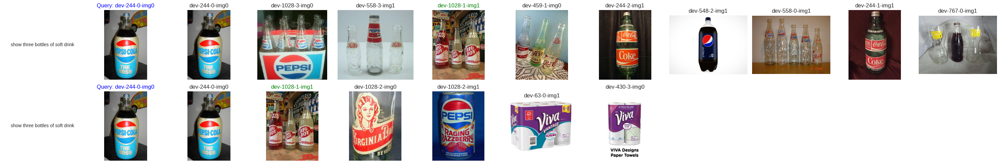

In [29]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

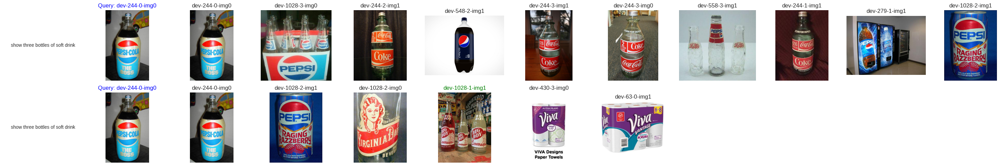

In [30]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=0)

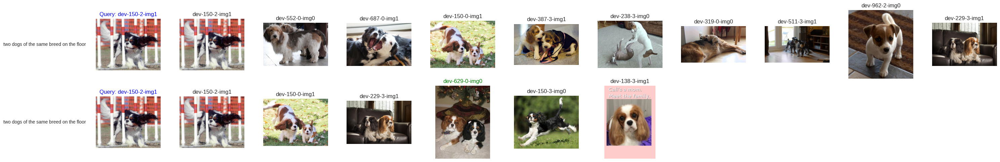

In [31]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

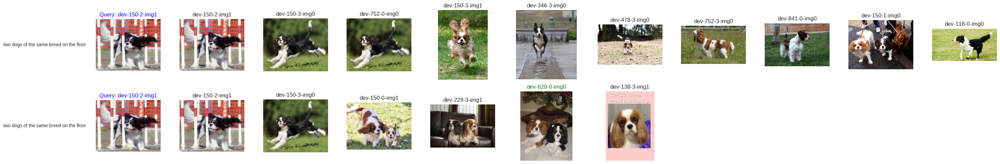

In [32]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

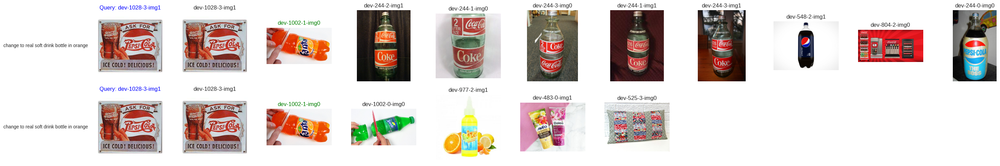

In [33]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

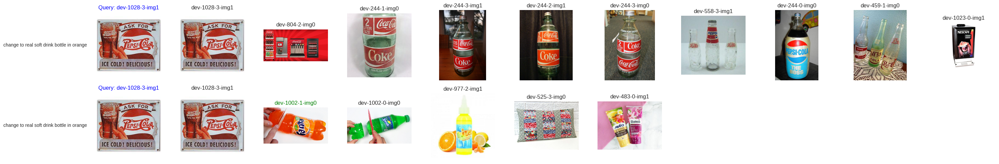

In [34]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)